# Train `l2hmc` Dynamics

## Imports / setup

In [1]:
%load_ext autoreload
%autoreload 2
%autosave 120
%load_ext rich
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Autosaving every 120 seconds


In [2]:
#import matplotlib.pyplot as plt
#import mpld3
#mpld3.enable_notebook()

In [3]:
import matplotx
import matplotlib.pyplot as plt
import seaborn as sns

FIGSIZE = (7, 3)

plt.style.use('default')
colors = {
    'blue': '#007DFF',
    'red': '#FF5252',
    'yellow': '#FFFF00',
    'green': '#63FF5B',
    'purple': '#AE81FF',
    'orange': '#FD971F',
    'white': '#CFCFCF',
}

#plt.style.use(matplotx.styles.dufte)
# sns.set_palette(list(colors.values()))
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('notebook', font_scale=0.8)
plt.rcParams.update({
    'image.cmap': 'viridis',
    'figure.facecolor': (1.0, 1.0, 1.0, 0.),
    'axes.facecolor': (1.0, 1.0, 1.0, 0.),
    'axes.edgecolor': (0, 0, 0, 0.0),
    'figure.edgecolor': (0, 0, 0, 0.0),
    'figure.dpi': plt.rcParamsDefault['figure.dpi'],
    'figure.figsize': plt.rcParamsDefault['figure.figsize'],
    'xtick.color': (0, 0, 0, 0.0),
    'ytick.color': (0, 0, 0, 0.0),
    'xtick.labelcolor': '#666666', 
    'ytick.labelcolor': '#666666', 
})

In [4]:
import os
import sys
from pathlib import Path

modulepath = Path(os.getcwd()).parent.parent.parent
if modulepath.as_posix() not in sys.path:
    sys.path.append(modulepath.as_posix())

## Set floating point precision

In [5]:
import tensorflow as tf
from l2hmc.utils.hvd_init import HAS_HOROVOD, IS_CHIEF, RANK
tf.keras.backend.set_floatx('float32')  # or 'float64 for double precision
tf.keras.backend.floatx() == tf.float32

True

In [6]:
# PyTorch
import torch
torch.set_default_dtype(torch.float32)

In [7]:
import os
os.environ['AUTOGRAPH_VERBOSITY'] = '0'
tf.autograph.set_verbosity(0)

In [8]:
from l2hmc.configs import PROJECT_DIR, HERE
PROJECT_DIR
HERE

PosixPath('/Users/saforem2/projects/l2hmc-qcd')

PosixPath('/Users/saforem2/projects/l2hmc-qcd/src/l2hmc')

In [9]:
import os
from pathlib import Path
from omegaconf import OmegaConf
from hydra import initialize, initialize_config_module, initialize_config_dir, compose
from l2hmc.common import get_timestamp
from l2hmc.common import train as train_common
from l2hmc.configs import CONF_DIR
def train(framework: str = 'tensorflow', overrides: list[str] = None):
    conf_dir = Path(CONF_DIR).resolve().absolute().as_posix()
    day = get_timestamp('%Y-%m-%d')
    time = get_timestamp('%H-%M-%S')
    outdir = Path(os.getcwd()).joinpath('outputs', 'jupyter',
                                        f'{framework}', day, time)
    outdir.mkdir(exist_ok=True, parents=True)
    with initialize_config_dir(config_dir=conf_dir):
        overrides.append(f'framework={framework}')
        overrides.append(f'+outdir={outdir.as_posix()}')
        cfg=compose(
            config_name="config.yaml", 
            overrides=overrides,
        )
        print(OmegaConf.to_yaml(cfg, resolve=True))
        output = train_common(cfg)

    return cfg, output

In [10]:
import torch

def plot_plaqs_diffs(cfg, output, xarr=None):
    dynamics = output['setup']['dynamics']
    lattice = output['setup']['lattice']
    if xarr is None:
        xarr = output['train_output']['xarr']

    plaqs = []
    for x in xarr:
        if isinstance(x, torch.Tensor):
            plaqs.append(
                lattice.plaqs_diff(beta=cfg.get('beta'), x=x).detach().numpy()
            )
        else:
            plaqs.append(lattice.plaqs_diff(beta=cfg.get('beta'), x=x))

    plaqs = np.array(plaqs)
    ndraws, nchains = plaqs.shape
    xplot = np.arange(ndraws)
    with plt.style.context(matplotx.styles.dufte):
        fig, ax = plt.subplots(figsize=FIGSIZE, constrained_layout=True)
        _ = ax.plot(xplot, plaqs.mean(-1), label='avg', lw=2.0, color='C0');
        for idx in range(16):
            _ = ax.plot(xplot, plaqs[:, idx], lw=1.0, alpha=0.5, color='C0')

        _ = ax.set_ylabel(r'$\delta x_{P}$')
        _ = ax.set_xlabel('Train Epoch')
        _ = ax.grid(True, alpha=0.4)

In [11]:
import xarray as xr
from l2hmc.utils.plot_helpers import plot_dataArray, make_ridgeplots

def make_plots(dataset: xr.Dataset, title: str = None, **kwargs):
    for key, val in dataset.data_vars.items():
        _ = plot_dataArray(val, key=key, num_chains=10, title=title, **kwargs)

In [12]:
OPTIONS = [
    'beta=3.0',
    'mode=cpu',
    '+width=150',
    'dynamics.nleapfrog=8',
    'dynamics.xshape=[128, 8, 8, 2]',
    'steps=debug',
    'steps.nera=10',
    'steps.nepoch=200',
    'steps.print=20',
    'steps.log=10',
]
frameworks = {
    'pytorch': {},
    'tensorflow': {},
}
outputs = {}
configs = {}
outputs.update(frameworks)
configs.update(frameworks)

# Train using `tensorflow`

## `DynamicsConfig.merge_directions = True`

beta: 3.0
framework: tensorflow
save_x: true
print_config: true
ignore_warnings: true
seed: null
compile: true
name: null
steps:
  nera: 10
  nepoch: 200
  test: 10
  log: 10
  print: 20
dynamics:
  xshape:
  - 128
  - 8
  - 8
  - 2
  eps: 0.01
  nleapfrog: 8
  eps_fixed: false
  use_ncp: true
  use_split_xnets: true
  use_separate_networks: true
  merge_directions: true
  verbose: true
loss:
  use_mixed_loss: true
  charge_weight: 0.01
  plaq_weight: 0.0
network:
  units:
  - 16
  - 16
  - 16
  - 16
  dropout_prob: 0.0
  activation_fn: relu
  use_batch_norm: false
net_weights:
  x:
    s: 1.0
    t: 1.0
    q: 1.0
  v:
    s: 1.0
    t: 1.0
    q: 1.0
conv: {}
debug_mode: false
width: 150
outdir: /Users/saforem2/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/jupyter/tensorflow/2022-02-06/19-59-54



2022-02-06 19:59:54.553586: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Output()

[20:00:58] Era 0 took: 62 s                                                                                                             ]8;id=671253;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=948034;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=719009;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=480426;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=2.183, loss=2.644, energy=112.7, logdet=-0.06168, logprob=112.8, xeps=0.0249, veps=0.02262, acc=0.7709,                                 
           sumlogdet=-0.0001035, acc_mask=0.777

Output()

[20:01:18] Era 1 took: 20 s                                                                                                             ]8;id=203393;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=334724;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=930985;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=255371;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.09495, loss=1.031, energy=100.4, logdet=0.01968, logprob=100.4, xeps=0.03726, veps=0.0344, acc=0.7896,                                
           sumlogdet=-0.001013, acc_mask=0.7969

Output()

[20:01:38] Era 2 took: 20 s                                                                                                             ]8;id=366270;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=111914;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=150258;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=693577;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.09918, loss=-2.953, energy=100.9, logdet=0.06219, logprob=100.8, xeps=0.05929, veps=0.05239, acc=0.7188,                              
           sumlogdet=-0.0004878, acc_mask=0.7195

Output()

[20:02:00] Era 3 took: 22 s                                                                                                             ]8;id=407921;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=482143;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=363491;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=203157;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.1063, loss=-4.911, energy=100.9, logdet=0.09575, logprob=100.8, xeps=0.07166, veps=0.06273, acc=0.7097,                               
           sumlogdet=0.003869, acc_mask=0.7191

Output()

           Avgs over last era:                                                                                                          ]8;id=432940;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=127559;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.1234, loss=-6.939, energy=101.3, logdet=0.1565, logprob=101.1, xeps=0.08376, veps=0.06825, acc=0.659,                                 
           sumlogdet=-0.001714, acc_mask=0.6711

Output()

[20:02:51] Era 5 took: 26 s                                                                                                             ]8;id=27478;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=369071;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=233768;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=250258;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.1328, loss=-8.415, energy=101.8, logdet=0.1883, logprob=101.6, xeps=0.09365, veps=0.0784, acc=0.6697,                                 
           sumlogdet=0.0002555, acc_mask=0.6617

Output()

[20:03:18] Era 6 took: 27 s                                                                                                             ]8;id=815899;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=112823;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=418568;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=921261;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.1313, loss=-9.366, energy=102.4, logdet=0.2321, logprob=102.1, xeps=0.1094, veps=0.08404, acc=0.5903,                                 
           sumlogdet=-0.001326, acc_mask=0.5961

Output()

[20:03:47] Era 7 took: 29 s                                                                                                             ]8;id=537365;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=95287;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=709178;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=683872;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.1379, loss=-11.33, energy=101.2, logdet=0.2309, logprob=101  , xeps=0.1137, veps=0.09765, acc=0.6888,                                 
           sumlogdet=-0.0009173, acc_mask=0.682

Output()

[20:04:16] Era 8 took: 29 s                                                                                                             ]8;id=949068;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=937303;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=480160;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=700888;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.1448, loss=-14.07, energy=101.7, logdet=0.342, logprob=101.4, xeps=0.1309, veps=0.1027, acc=0.6013, sumlogdet=0.002568,               
           acc_mask=0.591

Output()

[20:04:46] Era 9 took: 30 s                                                                                                             ]8;id=904718;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=156030;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=141164;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=705659;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.1607, loss=-14.76, energy=101.7, logdet=0.4148, logprob=101.2, xeps=0.1459, veps=0.1148, acc=0.5651,                                  
           sumlogdet=4.001e-05, acc_mask=0.5664

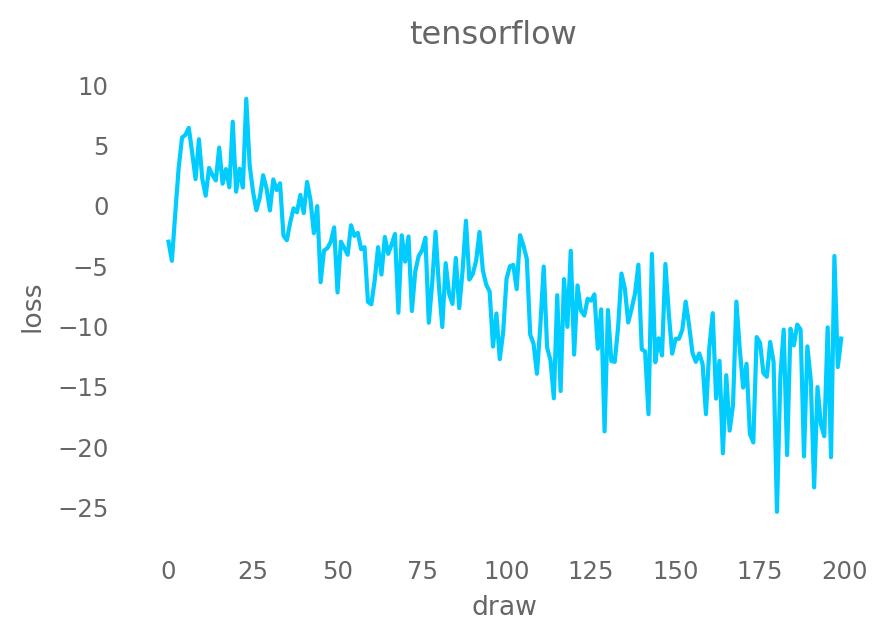

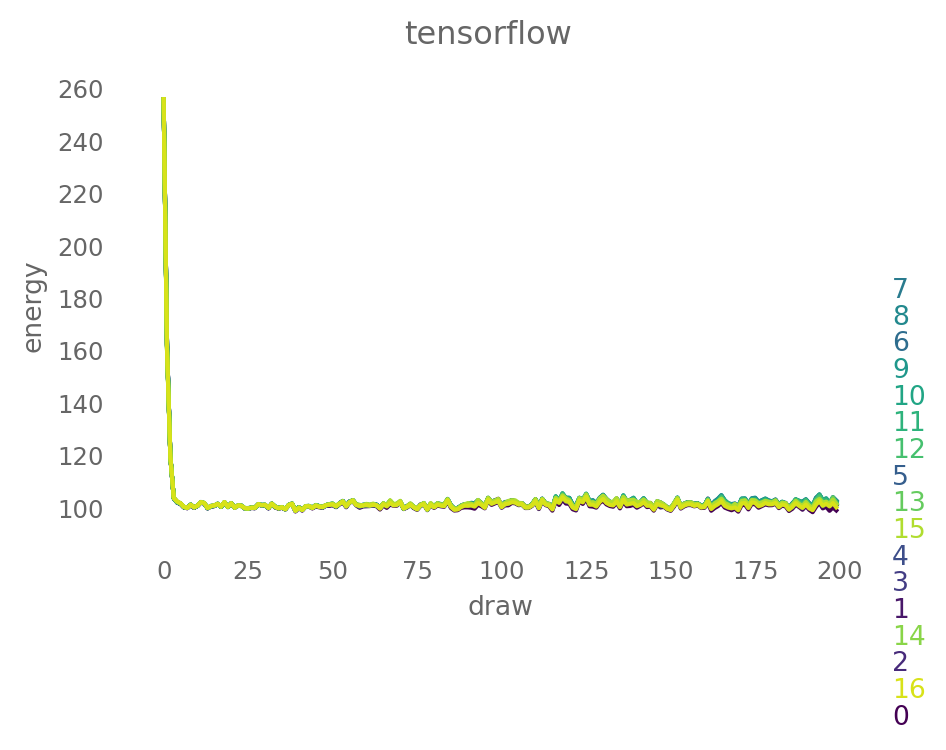

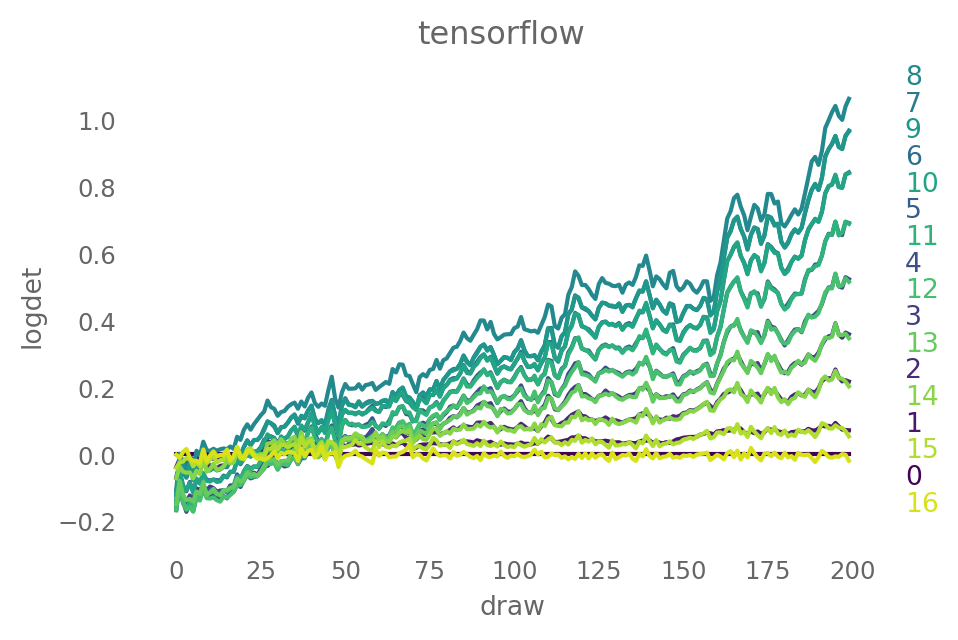

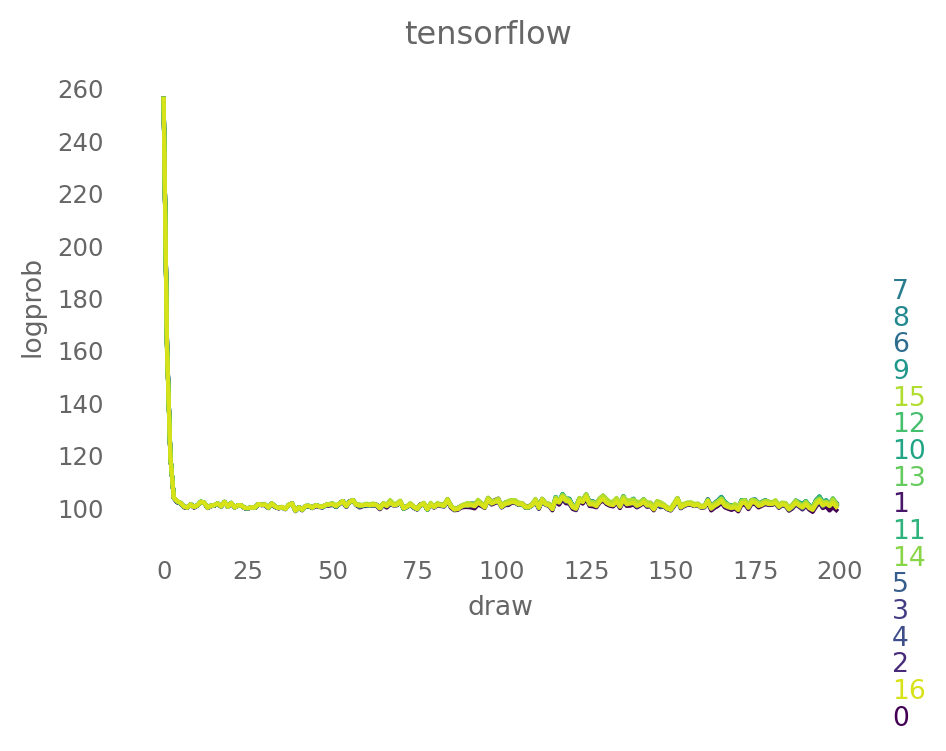

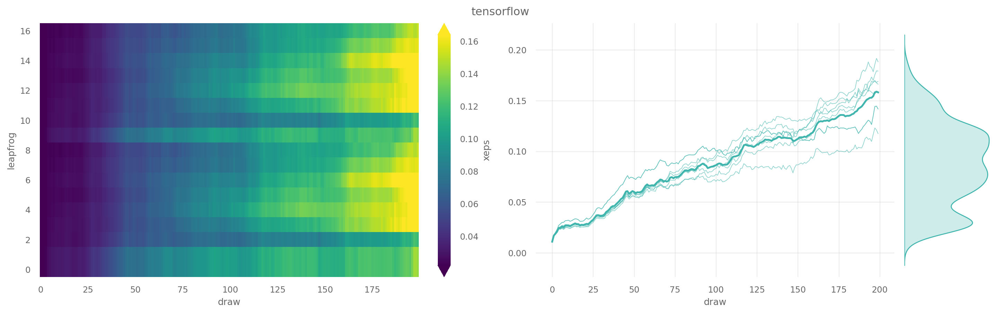

...

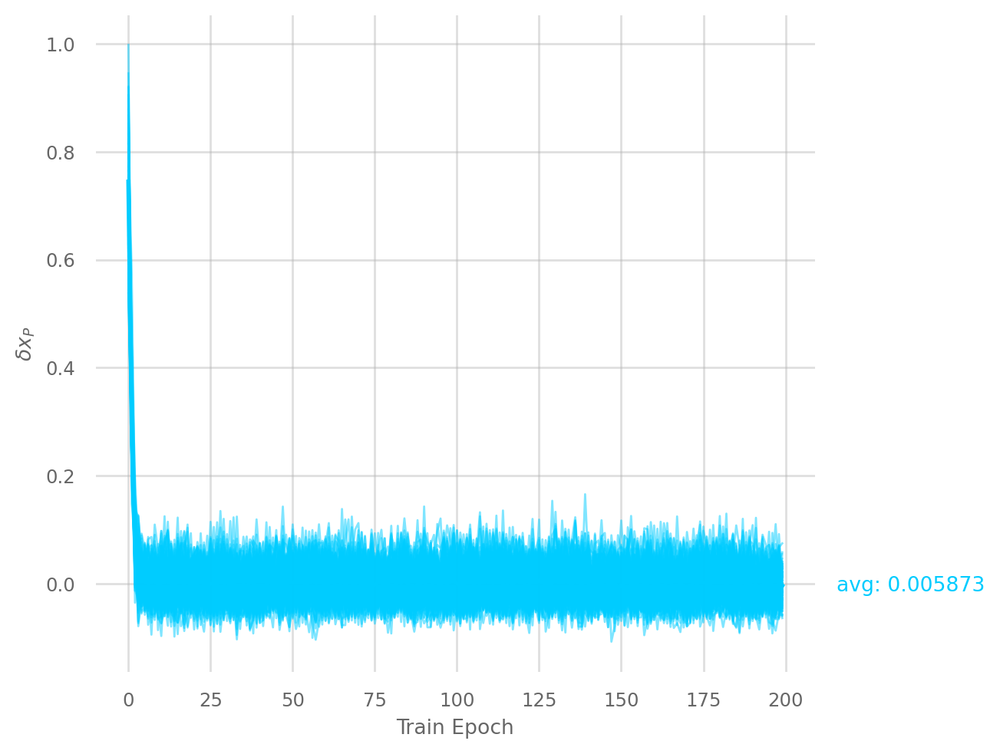

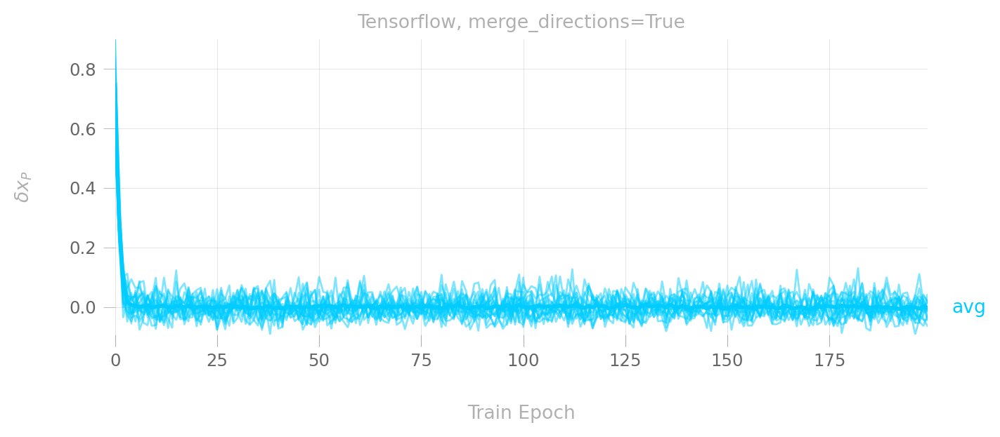

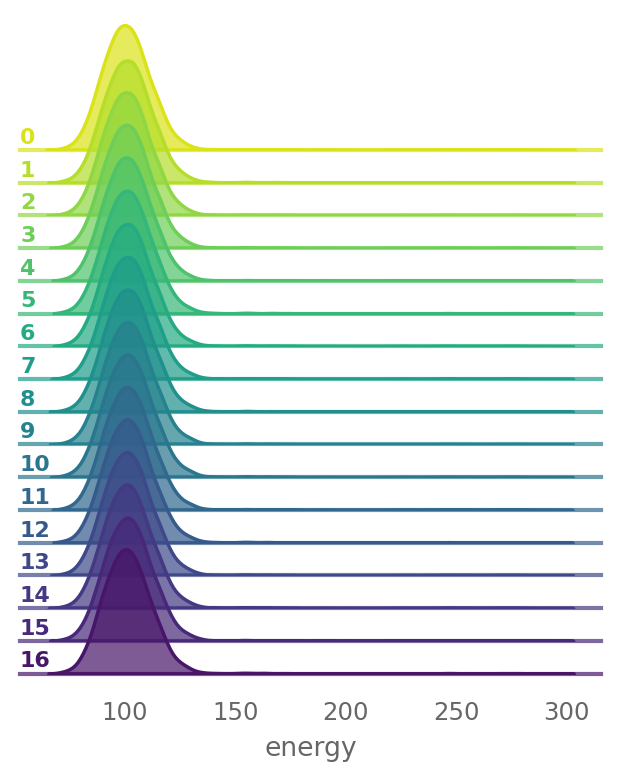

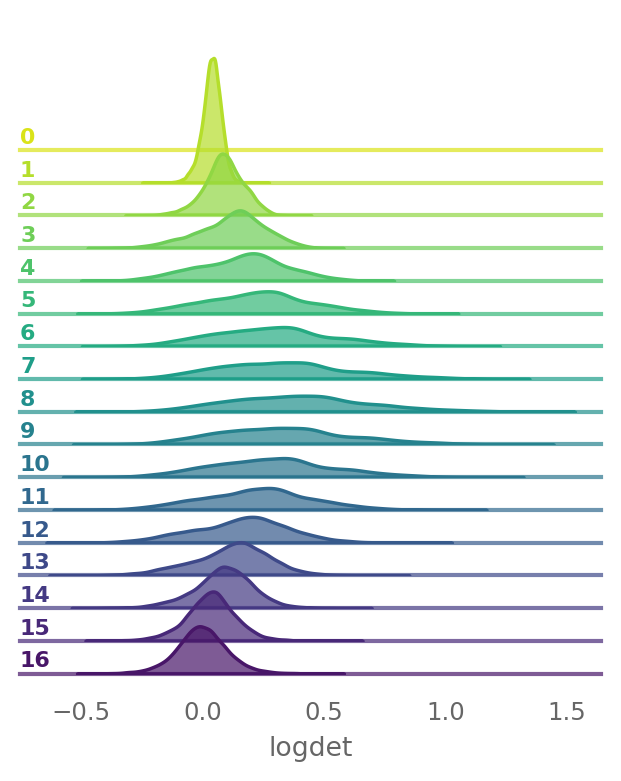

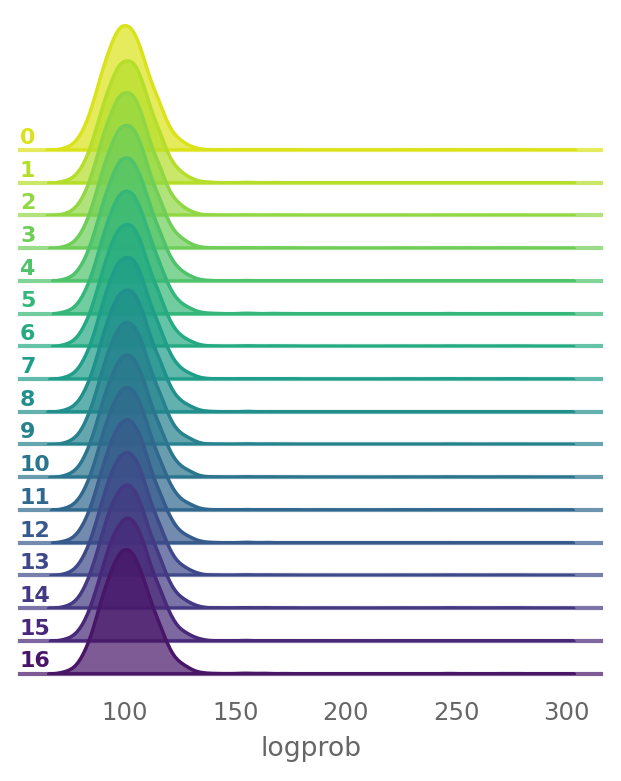

In [13]:
sns.set_context('notebook', font_scale=0.8)
overrides = ['dynamics.merge_directions=true'] + OPTIONS
config, output = train(framework='tensorflow', overrides=overrides)
plot_plaqs_diffs(config, output)
matplotx.line_labels()
ax = plt.gca()
_ = ax.set_title('Tensorflow, merge_directions=True');
_ = make_ridgeplots(output['history'].get_dataset(), num_chains=64)

outputs['tensorflow'].update({
    'merge': {
        'config': config,
        'output': output,
    }
})

## `DynamicsConfig.merge_directions = False`

beta: 3.0
framework: tensorflow
save_x: true
print_config: true
ignore_warnings: true
seed: null
compile: true
name: null
steps:
  nera: 10
  nepoch: 200
  test: 10
  log: 10
  print: 20
dynamics:
  xshape:
  - 128
  - 8
  - 8
  - 2
  eps: 0.01
  nleapfrog: 8
  eps_fixed: false
  use_ncp: true
  use_split_xnets: true
  use_separate_networks: true
  merge_directions: false
  verbose: true
loss:
  use_mixed_loss: true
  charge_weight: 0.01
  plaq_weight: 0.0
network:
  units:
  - 16
  - 16
  - 16
  - 16
  dropout_prob: 0.0
  activation_fn: relu
  use_batch_norm: false
net_weights:
  x:
    s: 1.0
    t: 1.0
    q: 1.0
  v:
    s: 1.0
    t: 1.0
    q: 1.0
conv: {}
debug_mode: false
width: 150
outdir: /Users/saforem2/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/jupyter/tensorflow/2022-02-06/20-06-39



Output()

[20:07:42] Era 0 took: 61 s                                                                                                             ]8;id=621274;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=664306;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=343038;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=101531;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=2.21 , loss=4.566, acc=0.7606, acc_mask=0.766, sumlogdet=-0.005681, fwd/energy=119.3, fwd/logdet=0.1543,                                
           fwd/logprob=119.1, fwd/xeps=0.03954, fwd/veps=0.03572, fwd/acc=0.7571, fwd/sumlogdet=0.2494, bwd/energy=119.1,                             
           bwd/logdet=-0.1077, bwd/logprob=119.2, bwd/xeps=0.03954, bwd/veps=0.03572, bwd/acc=0.7603, bwd/sumlogdet=-0.2689

Output()

[20:07:59] Era 1 took: 16 s                                                                                                             ]8;id=421195;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=629814;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=515743;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=407837;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.08095, loss=3.126, acc=0.8027, acc_mask=0.8039, sumlogdet=7.984e-05, fwd/energy=100.5, fwd/logdet=0.1044,                             
           fwd/logprob=100.4, fwd/xeps=0.05454, fwd/veps=0.05156, fwd/acc=0.803, fwd/sumlogdet=0.1549, bwd/energy=100.7,                              
           bwd/logdet=-0.05166, bwd/logprob=100.8, bwd/xeps=0.05454, bwd/veps=0.05156, bwd/acc=0.8014, bwd/sumlogdet=-0.1589

Output()

[20:08:13] Era 2 took: 14 s                                                                                                             ]8;id=428009;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=121820;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=170238;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=327232;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.06627, loss=1.996, acc=0.8246, acc_mask=0.8223, sumlogdet=0.001754, fwd/energy=100.7, fwd/logdet=0.03656,                             
           fwd/logprob=100.6, fwd/xeps=0.06197, fwd/veps=0.05845, fwd/acc=0.8257, fwd/sumlogdet=0.02415, bwd/energy=100.7,                            
           bwd/logdet=0.01162, bwd/logprob=100.6, bwd/xeps=0.06197, bwd/veps=0.05845, bwd/acc=0.8257, bwd/sumlogdet=-0.02539

Output()

[20:08:28] Era 3 took: 15 s                                                                                                             ]8;id=645251;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=796201;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=247157;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=25013;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.07286, loss=1.353, acc=0.8382, acc_mask=0.8363, sumlogdet=-0.0008417, fwd/energy=100.6, fwd/logdet=0.02916,                           
           fwd/logprob=100.6, fwd/xeps=0.06918, fwd/veps=0.06621, fwd/acc=0.837, fwd/sumlogdet=-0.01292, bwd/energy=100.5,                            
           bwd/logdet=0.03894, bwd/logprob=100.5, bwd/xeps=0.06918, bwd/veps=0.06621, bwd/acc=0.8372, bwd/sumlogdet=0.007299

Output()

[20:08:44] Era 4 took: 16 s                                                                                                             ]8;id=919718;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=620079;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=537287;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=661637;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.07993, loss=-1.608, acc=0.8251, acc_mask=0.8215, sumlogdet=-0.0008355, fwd/energy=101  , fwd/logdet=0.07325,                          
           fwd/logprob=100.9, fwd/xeps=0.08869, fwd/veps=0.08419, fwd/acc=0.83 , fwd/sumlogdet=0.06474, bwd/energy=100.6,                             
           bwd/logdet=0.005348, bwd/logprob=100.6, bwd/xeps=0.08869, bwd/veps=0.08419, bwd/acc=0.8332, bwd/sumlogdet=-0.07284

Output()

[20:08:59] Era 5 took: 16 s                                                                                                             ]8;id=742;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=83814;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=438827;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=537892;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.08206, loss=-2.873, acc=0.8254, acc_mask=0.8211, sumlogdet=0.001315, fwd/energy=100.6, fwd/logdet=0.09109,                            
           fwd/logprob=100.5, fwd/xeps=0.09978, fwd/veps=0.09411, fwd/acc=0.8318, fwd/sumlogdet=0.08942, bwd/energy=100.7,                            
           bwd/logdet=0.0004374, bwd/logprob=100.7, bwd/xeps=0.09978, bwd/veps=0.09411, bwd/acc=0.8221, bwd/sumlogdet=-0.09102

Output()

[20:09:16] Era 6 took: 16 s                                                                                                             ]8;id=509686;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=227251;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=227119;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=498731;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.07894, loss=-3.981, acc=0.781, acc_mask=0.784, sumlogdet=-0.001471, fwd/energy=100.9, fwd/logdet=0.08196,                             
           fwd/logprob=100.8, fwd/xeps=0.1189, fwd/veps=0.1098, fwd/acc=0.7771, fwd/sumlogdet=0.04235, bwd/energy=100.8,                              
           bwd/logdet=0.03795, bwd/logprob=100.7, bwd/xeps=0.1189, bwd/veps=0.1098, bwd/acc=0.7804, bwd/sumlogdet=-0.04632

Output()

[20:09:33] Era 7 took: 18 s                                                                                                             ]8;id=881720;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=12979;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=122553;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=697753;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.08654, loss=-4.289, acc=0.749, acc_mask=0.7445, sumlogdet=0.003943, fwd/energy=101.1, fwd/logdet=0.05574,                             
           fwd/logprob=101  , fwd/xeps=0.1277, fwd/veps=0.1148, fwd/acc=0.7452, fwd/sumlogdet=-0.02001, bwd/energy=100.9,                             
           bwd/logdet=0.0722, bwd/logprob=100.8, bwd/xeps=0.1277, bwd/veps=0.1148, bwd/acc=0.7462, bwd/sumlogdet=0.01379

Output()

[20:09:50] Era 8 took: 17 s                                                                                                             ]8;id=702606;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=513870;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=994967;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=74728;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.08981, loss=-5.403, acc=0.7801, acc_mask=0.7738, sumlogdet=-0.00629, fwd/energy=100.6, fwd/logdet=-0.05554,                           
           fwd/logprob=100.7, fwd/xeps=0.13 , fwd/veps=0.1188, fwd/acc=0.7811, fwd/sumlogdet=-0.2468, bwd/energy=101  ,                               
           bwd/logdet=0.1869, bwd/logprob=100.9, bwd/xeps=0.13 , bwd/veps=0.1188, bwd/acc=0.77 , bwd/sumlogdet=0.2381

Output()

[20:10:09] Era 9 took: 19 s                                                                                                             ]8;id=492151;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=469659;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=454950;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=568168;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.09076, loss=-5.523, acc=0.7814, acc_mask=0.7785, sumlogdet=-0.002195, fwd/energy=101.1, fwd/logdet=0.01487,                           
           fwd/logprob=101  , fwd/xeps=0.1402, fwd/veps=0.1284, fwd/acc=0.7753, fwd/sumlogdet=-0.1219, bwd/energy=101.5,                              
           bwd/logdet=0.1324, bwd/logprob=101.3, bwd/xeps=0.1402, bwd/veps=0.1284, bwd/acc=0.7784, bwd/sumlogdet=0.1125

Text(0.5, 1.0, 'Tensorflow, merge_directions=False')

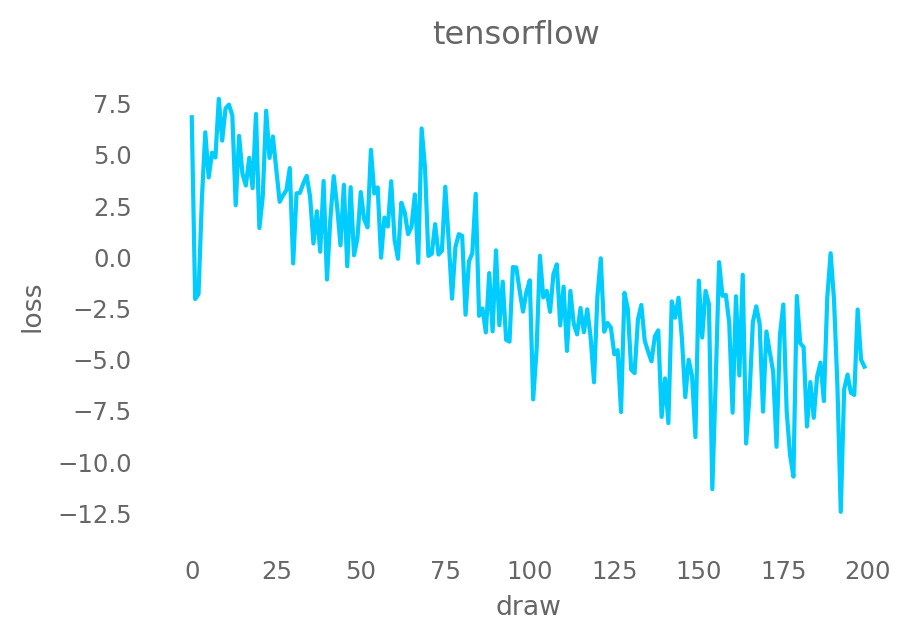

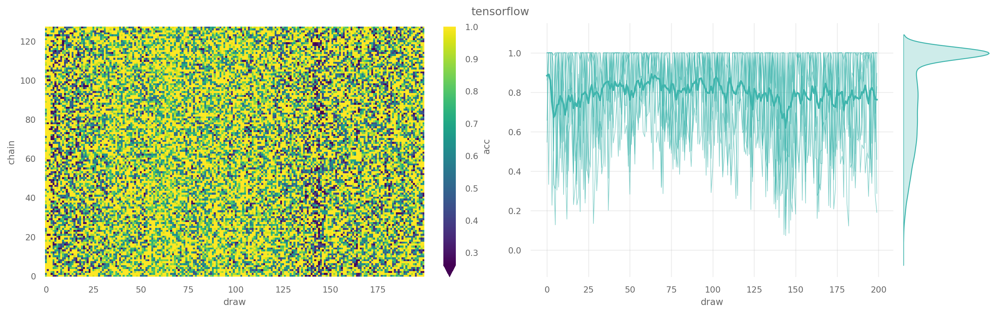

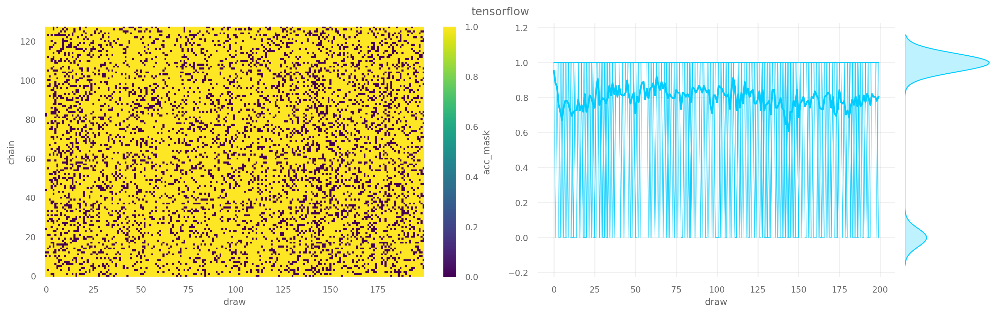

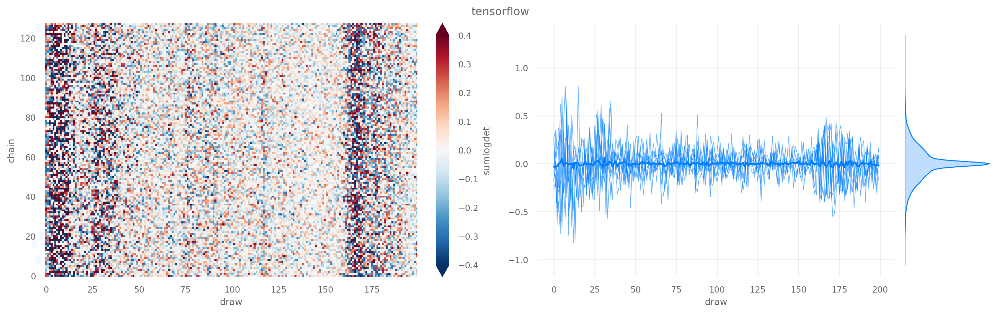

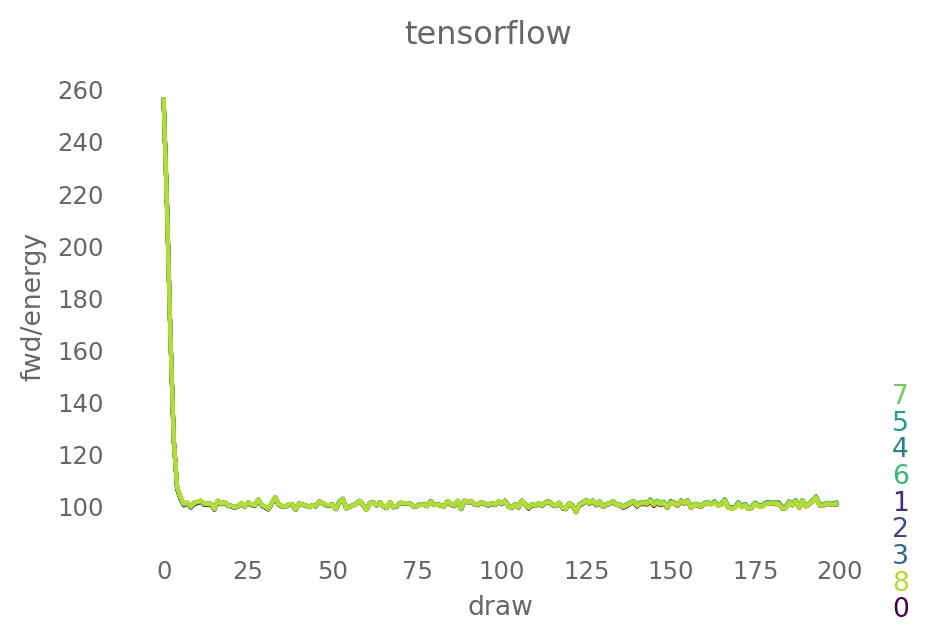

...

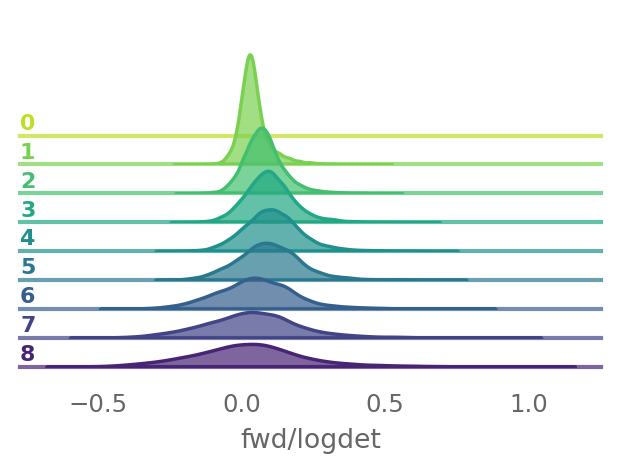

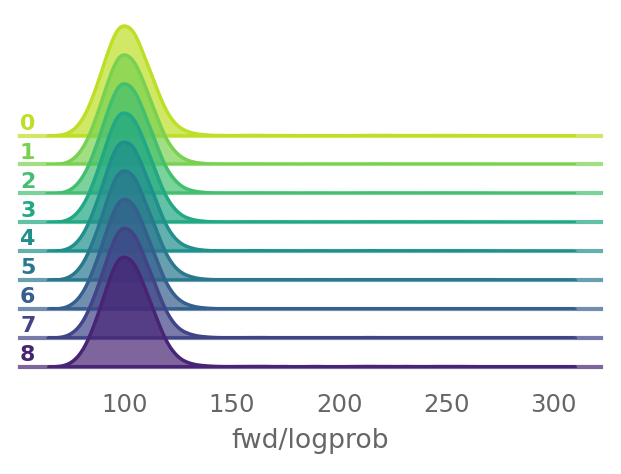

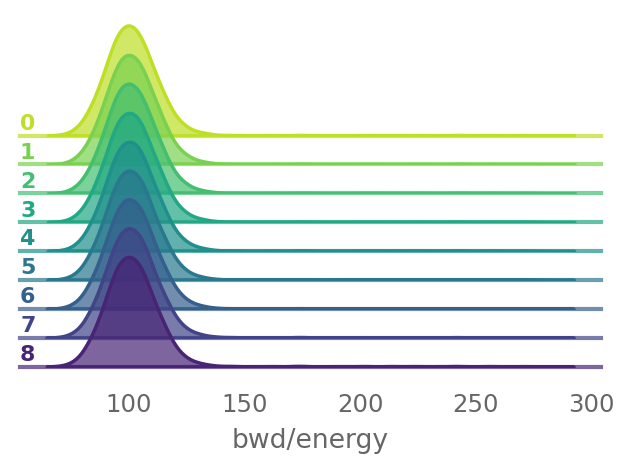

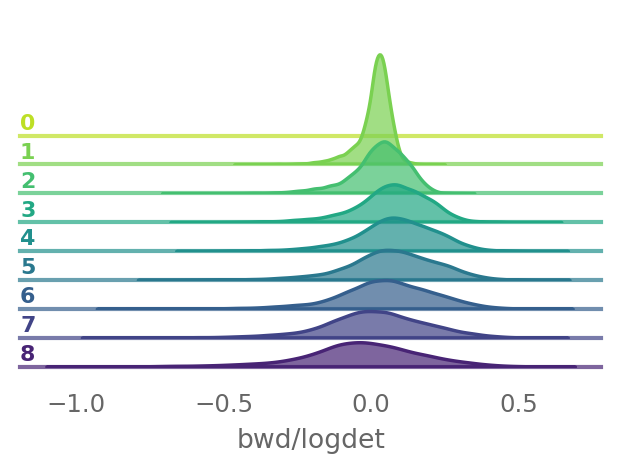

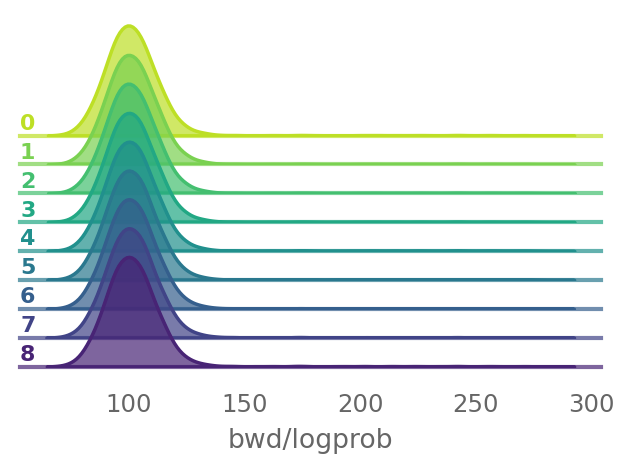

In [14]:
overrides = ['dynamics.merge_directions=false'] + OPTIONS
config, output = train(framework='tensorflow', overrides=overrides)
plot_plaqs_diffs(config, output)
matplotx.line_labels()
ax = plt.gca()
ax.set_title('Tensorflow, merge_directions=False')
_ = make_ridgeplots(output['history'].get_dataset(), num_chains=64)
outputs['tensorflow'].update({
    'no_merge': {
        'config': config,
        'output': output,
    }
})

# Train using `pytorch`

## `merge_directions = True`

Output()

beta: 3.0
framework: pytorch
save_x: true
print_config: true
ignore_warnings: true
seed: null
compile: true
name: null
steps:
  nera: 10
  nepoch: 200
  test: 10
  log: 10
  print: 20
dynamics:
  xshape:
  - 128
  - 8
  - 8
  - 2
  eps: 0.01
  nleapfrog: 8
  eps_fixed: false
  use_ncp: true
  use_split_xnets: true
  use_separate_networks: true
  merge_directions: true
  verbose: true
loss:
  use_mixed_loss: true
  charge_weight: 0.01
  plaq_weight: 0.0
network:
  units:
  - 16
  - 16
  - 16
  - 16
  dropout_prob: 0.0
  activation_fn: relu
  use_batch_norm: false
net_weights:
  x:
    s: 1.0
    t: 1.0
    q: 1.0
  v:
    s: 1.0
    t: 1.0
    q: 1.0
conv: {}
debug_mode: false
width: 150
outdir: /Users/saforem2/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/jupyter/pytorch/2022-02-06/20-12-43



[20:13:50] Era 0 took: 66 s

           Avgs over last era:                                                                                                                        
            dt=0.3236, loss=1.484, energy=113.2, logprob=113.1, logdet=0.105, xeps=0.02753, veps=0.02583, acc=0.8288, sumlogdet=-0.001232,            
           acc_mask=0.8219

Output()

[20:14:59] Era 1 took: 69 s

           Avgs over last era:                                                                                                                        
            dt=0.3439, loss=-1.521, energy=100.6, logprob=100.4, logdet=0.1837, xeps=0.04413, veps=0.04172, acc=0.8224, sumlogdet=-0.0004001,         
           acc_mask=0.8219

Output()

[20:16:14] Era 2 took: 75 s

           Avgs over last era:                                                                                                                        
            dt=0.3627, loss=-3.138, energy=101  , logprob=100.8, logdet=0.2356, xeps=0.06117, veps=0.05573, acc=0.7516, sumlogdet=-0.0004218,         
           acc_mask=0.7547

Output()

[20:17:33] Era 3 took: 80 s

           Avgs over last era:                                                                                                                        
            dt=0.3842, loss=-5.795, energy=101  , logprob=100.7, logdet=0.2983, xeps=0.07428, veps=0.06536, acc=0.7074, sumlogdet=0.0008969,          
           acc_mask=0.7016

Output()

[20:18:38] Era 4 took: 64 s

           Avgs over last era:                                                                                                                        
            dt=0.3223, loss=-4.774, energy=101.2, logprob=100.9, logdet=0.3158, xeps=0.07495, veps=0.06466, acc=0.7106, sumlogdet=0.001067,           
           acc_mask=0.7145

Output()

[20:19:43] Era 5 took: 65 s

           Avgs over last era:                                                                                                                        
            dt=0.3214, loss=-6.845, energy=101.1, logprob=100.7, logdet=0.3732, xeps=0.08432, veps=0.07604, acc=0.7312, sumlogdet=0.001162,           
           acc_mask=0.7273

Output()

[20:20:47] Era 6 took: 65 s

           Avgs over last era:                                                                                                                        
            dt=0.3265, loss=-8.163, energy=101.5, logprob=101.1, logdet=0.4335, xeps=0.09181, veps=0.08096, acc=0.6789, sumlogdet=-0.0009335,         
           acc_mask=0.6754

Output()

[20:21:53] Era 7 took: 66 s

           Avgs over last era:                                                                                                                        
            dt=0.3251, loss=-8.105, energy=101.5, logprob=101  , logdet=0.485, xeps=0.09976, veps=0.08991, acc=0.7002, sumlogdet=0.001989,            
           acc_mask=0.6988

Output()

[20:23:00] Era 8 took: 67 s

           Avgs over last era:                                                                                                                        
            dt=0.3444, loss=-12.2, energy=102  , logprob=101.4, logdet=0.6086, xeps=0.1146, veps=0.09647, acc=0.6221, sumlogdet=0.002622,             
           acc_mask=0.625

Output()

[20:24:04] Era 9 took: 64 s

           Avgs over last era:                                                                                                                        
            dt=0.3093, loss=-13.1, energy=102.4, logprob=101.7, logdet=0.7166, xeps=0.1256, veps=0.1033, acc=0.5983, sumlogdet=0.0009939,             
           acc_mask=0.6023

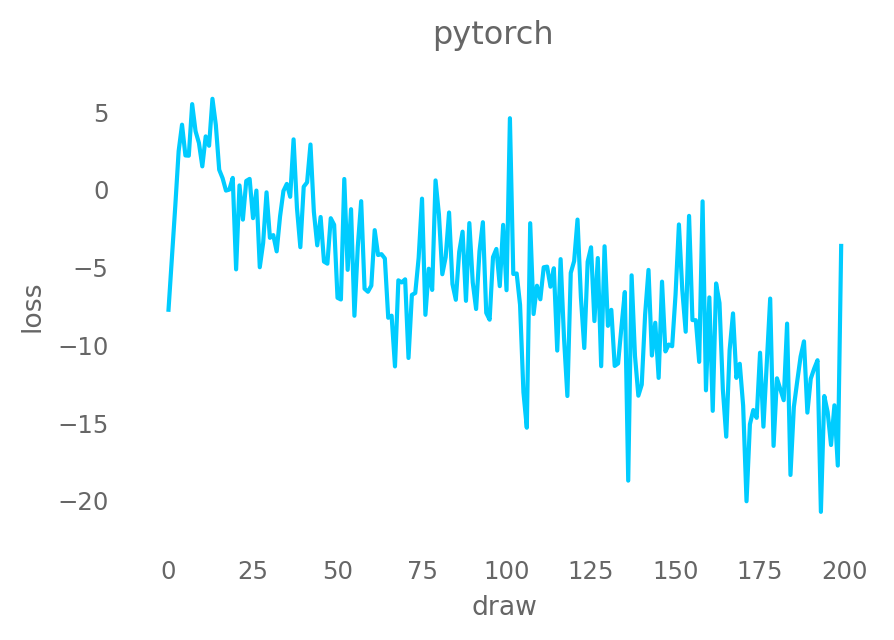

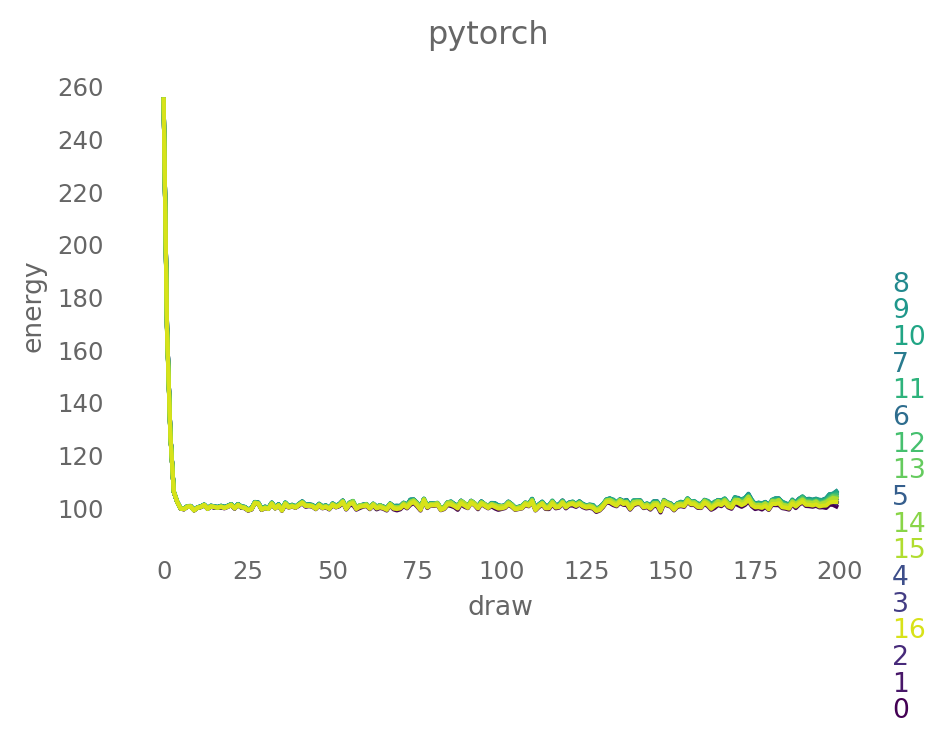

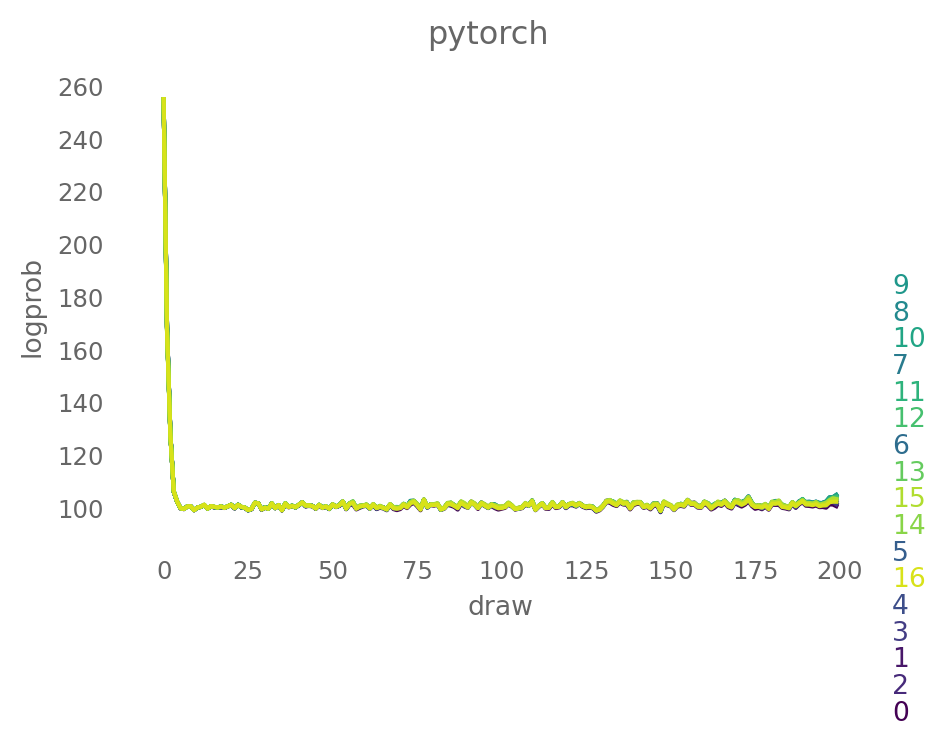

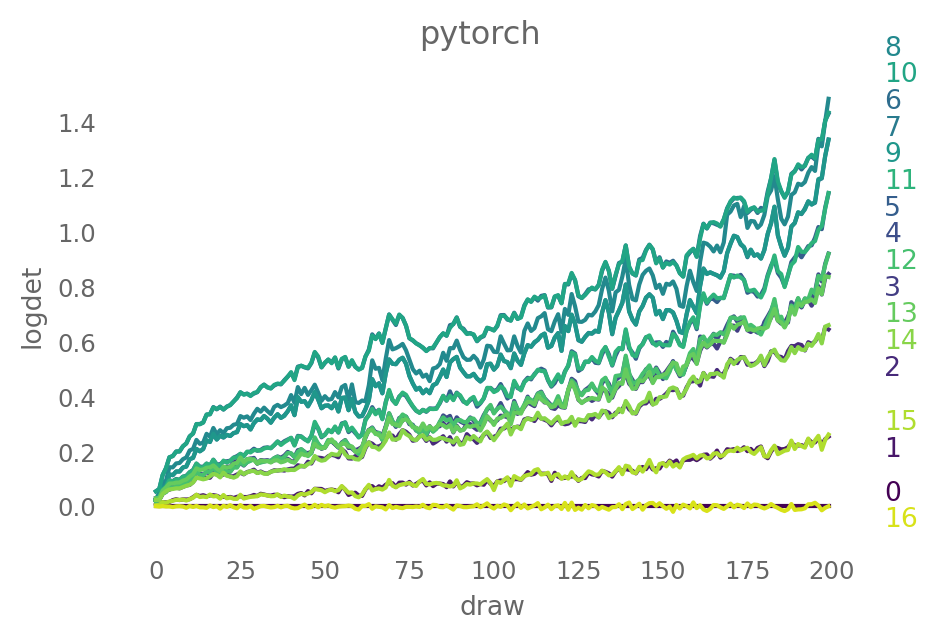

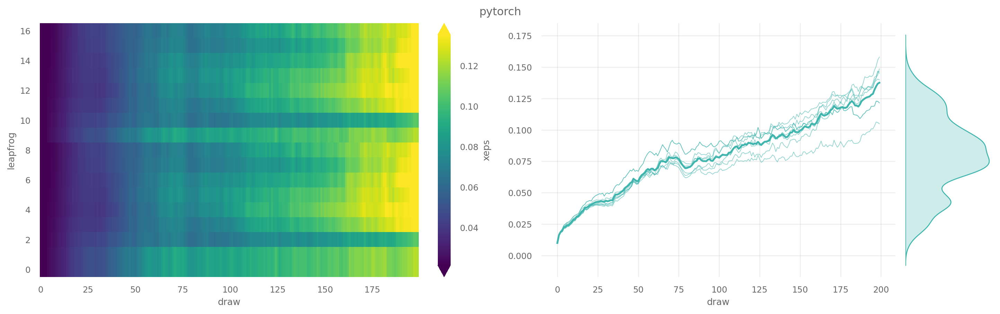

...

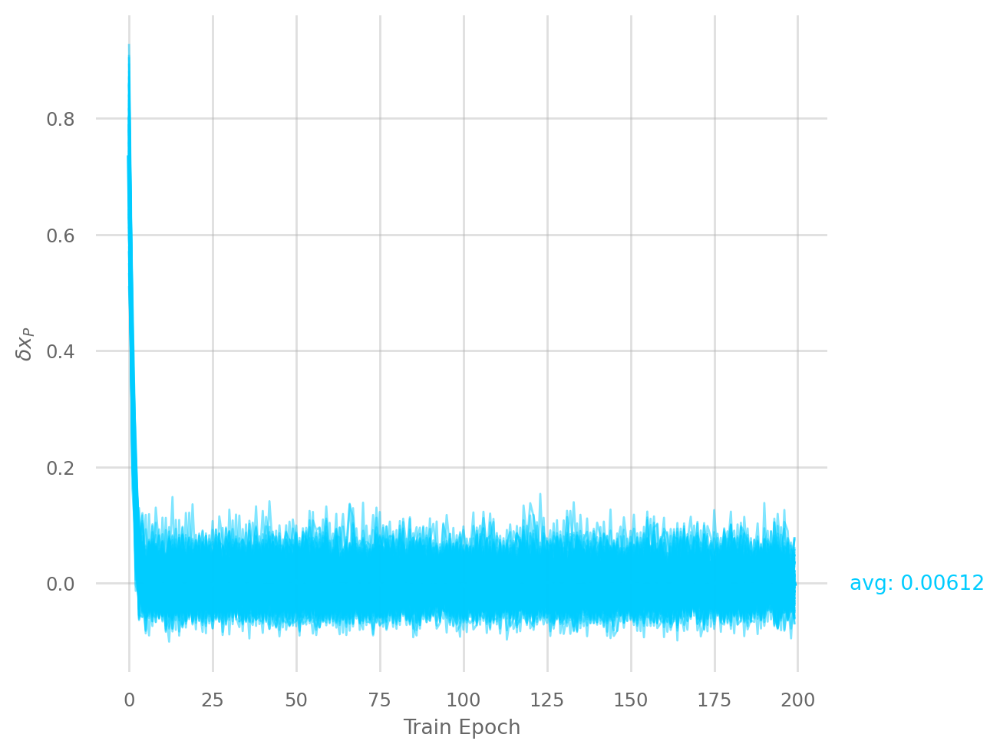

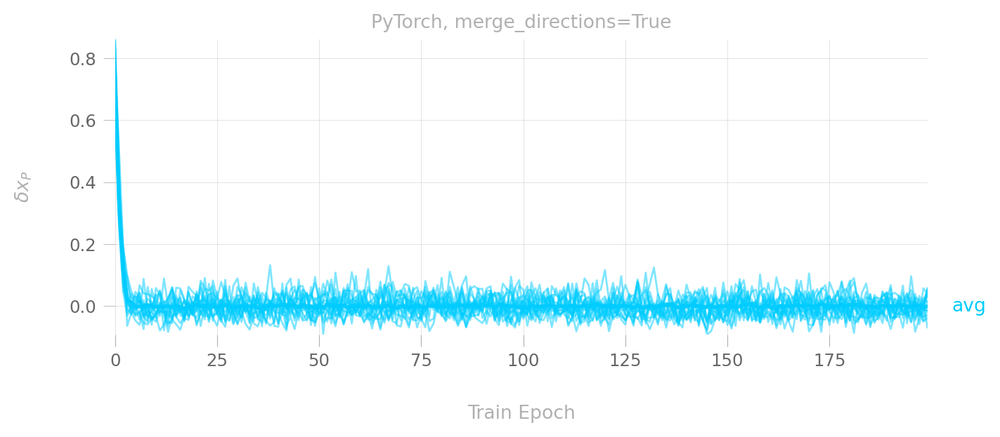

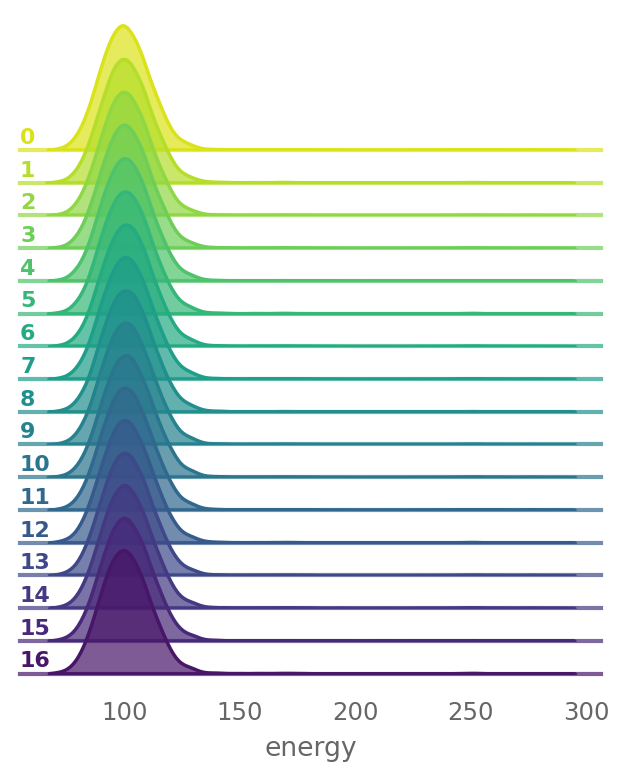

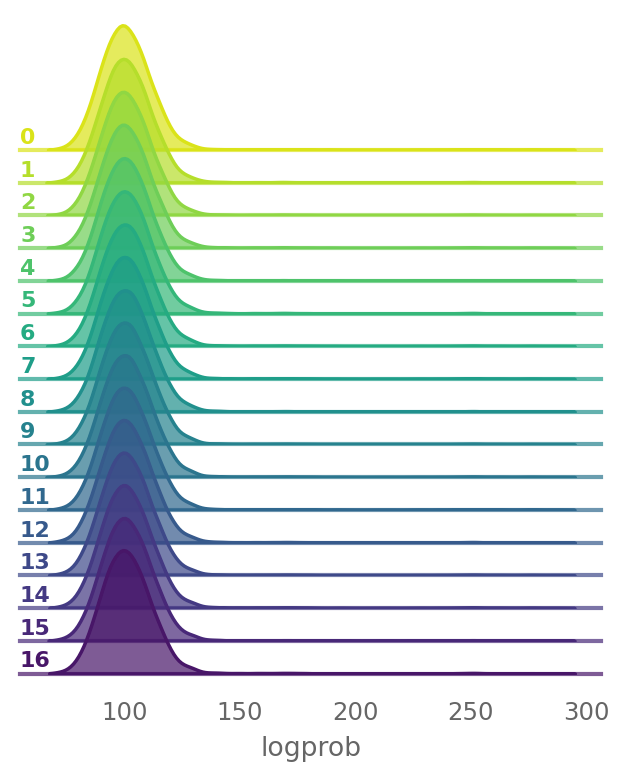

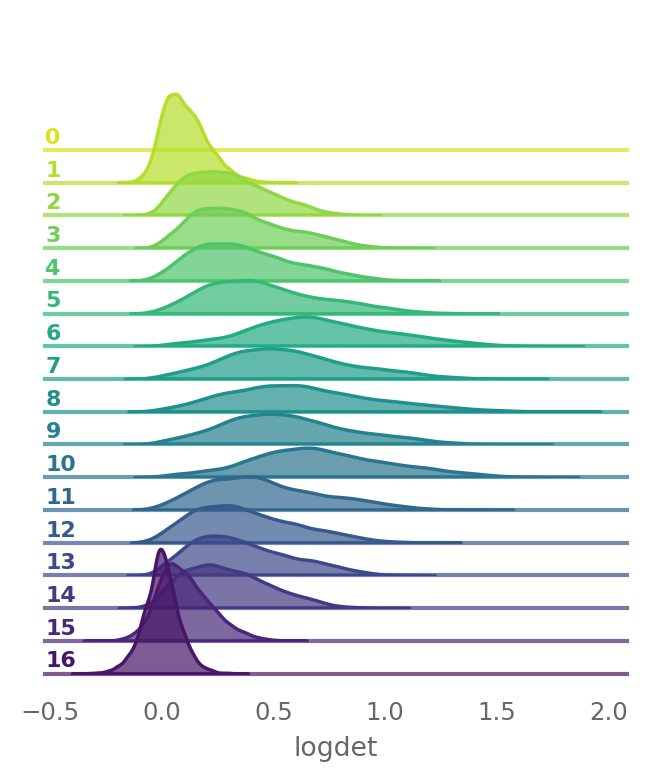

In [15]:
overrides = ['dynamics.merge_directions=true'] + OPTIONS
config, output = train(framework='pytorch', overrides=overrides)

plot_plaqs_diffs(config, output)
matplotx.line_labels()
ax = plt.gca()
_ = ax.set_title('PyTorch, merge_directions=True');
_ = make_ridgeplots(output['history'].get_dataset(), num_chains=64)

outputs['pytorch'].update({
    'merge': {
        'config': config,
        'output': output,
    }
})

## `merge_directions = False`

In [ ]:
overrides = ['dynamics.merge_directions=false'] + OPTIONS
config, output = train(framework='pytorch', overrides=overrides)

plot_plaqs_diffs(config, output)
matplotx.line_labels()
ax = plt.gca()
ax.set_title('PyTorch, merge_directions=False')
_ = make_ridgeplots(output['history'].get_dataset(), num_chains=64)

outputs['pytorch'].update({
    'no_merge': {
        'config': config,
        'output': output,
    }
})

Output()

beta: 3.0
framework: pytorch
save_x: true
print_config: true
ignore_warnings: true
seed: null
compile: true
name: null
steps:
  nera: 10
  nepoch: 200
  test: 10
  log: 10
  print: 20
dynamics:
  xshape:
  - 128
  - 8
  - 8
  - 2
  eps: 0.01
  nleapfrog: 8
  eps_fixed: false
  use_ncp: true
  use_split_xnets: true
  use_separate_networks: true
  merge_directions: false
  verbose: true
loss:
  use_mixed_loss: true
  charge_weight: 0.01
  plaq_weight: 0.0
network:
  units:
  - 16
  - 16
  - 16
  - 16
  dropout_prob: 0.0
  activation_fn: relu
  use_batch_norm: false
net_weights:
  x:
    s: 1.0
    t: 1.0
    q: 1.0
  v:
    s: 1.0
    t: 1.0
    q: 1.0
conv: {}
debug_mode: false
width: 150
outdir: /Users/saforem2/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/jupyter/pytorch/2022-02-06/20-26-41



In [83]:
dynamics_merge_pt = outputs['pytorch']['merge']['output']['setup']['dynamics']
dynamics_no_merge_pt = outputs['pytorch']['no_merge']['output']['setup']['dynamics']
dynamics_merge_tf = outputs['tensorflow']['merge']['output']['setup']['dynamics']
dynamics_no_merge_tf = outputs['tensorflow']['no_merge']['output']['setup']['dynamics']

In [84]:
def test_reversibility(dynamics, name: str = None):
    diff = dynamics.test_reversibility()
    dx = diff['dx']
    dv = diff['dv']
    print(f'{name} ' + ', '.join([f'avg(dx): {dx.mean()}', f'avg(dv): {dv.mean()}']))
    #print('\n'.join([
        #', '.join([f'sum(dx): {dx.sum()}', f'sum(dv): {dv.sum()}']),
    #]))
    return diff

In [87]:
diff_merge_pt = test_reversibility(dynamics_merge_pt, name='Pytorch, merge')
diff_merge_tf = test_reversibility(dynamics_merge_tf, name='Tensorflow, merge')

diff_no_merge_pt = test_reversibility(dynamics_no_merge_pt, name='Pytorch, no merge')
diff_no_merge_tf = test_reversibility(dynamics_no_merge_tf, name='Tensorflow, no merge')

Pytorch, merge avg(dx): 0.0022509051486849785, avg(dv): 0.002563966903835535
Tensorflow, merge avg(dx): 0.00046390295028686523, avg(dv): 0.0005893884226679802
Pytorch, no merge avg(dx): 0.006029559299349785, avg(dv): 0.0056344266049563885
Tensorflow, no merge avg(dx): 0.0024887206964194775, avg(dv): 0.002370634116232395


In [79]:
#sum([sum(i) for i in dynamics_merge_pt.parameters()])
sum(p.numel() for p in dynamics_merge_pt.parameters()) # if p.requires_grad)
#len(list(dynamics_merge_pt.parameters()))

196410

In [80]:
diff_merge_pt = dynamics_merge_pt.test_reversibility()
dx = diff_merge_pt["dx"].mean().detach().numpy()
dv = diff_merge_pt["dv"].mean().detach().numpy()
print(f'(dx, dv) = ({dx:.4g}, {dv:.4g})')

╭──────────────────────────── Traceback (most recent call last) ────────────────────────────╮
│                                                                                           │
│ /var/folders/b0/s0cn4kh53l55xstxzzsd3dn00000gn/T/ipykernel_24831/4212268034.py:2 in       │
│ <module>                                                                                  │
│                                                                                           │
│ [Errno 2] No such file or directory:                                                      │
│ '/var/folders/b0/s0cn4kh53l55xstxzzsd3dn00000gn/T/ipykernel_24831/4212268034.py'          │
╰───────────────────────────────────────────────────────────────────────────────────────────╯
AttributeError: 'numpy.float32' object has no attribute 'detach'

In [81]:
diff_merge_tf = dynamics_merge_tf.test_reversibility()
dx = tf.reduce_mean(diff_merge_tf["dx"])
dv = tf.reduce_mean(diff_merge_tf["dv"])
print(f'(dx, dv) = ({dx:.4g}, {dv:.4g})')

(dx, dv) = (0.000478, 0.0006097)


## Look at differences

In [21]:
outputs['tensorflow']['merge'].keys()

dict_keys(['config', 'output'])

In [22]:
losses = {
    'tensorflow_merge': outputs['tensorflow']['merge']['output']['history'].history['loss'],
    'tensorflow_no_merge': outputs['tensorflow']['no_merge']['output']['history'].history['loss'],
    'pytorch_merge': outputs['pytorch']['merge']['output']['history'].history['loss'],
    'pytorch_no_merge': outputs['pytorch']['no_merge']['output']['history'].history['loss'],
}

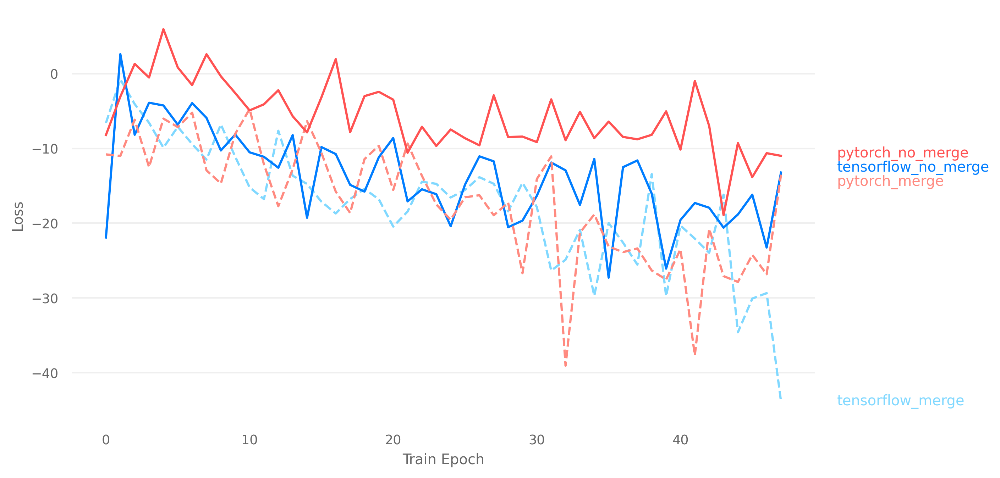

In [23]:
import matplotx
plt.rcParams.update({
    'figure.dpi': 150,
})
fig, ax = plt.subplots(figsize=(9, 5))

COLORS = {
    'blue': '#03A9F4',
    'alt_blue': '#80D8FF',
    'red': '#F44336',
    'alt_red': '#FF8A80',
}

styles = {
    'tensorflow_merge': {'color': COLORS['alt_blue'], 'ls': '--'},
    'tensorflow_no_merge': {'color': colors['blue'], 'ls': '-'},
    'pytorch_merge': {'color': COLORS['alt_red'], 'ls': '--'},
    'pytorch_no_merge': {'color': colors['red'], 'ls': '-'}
}
# colors = ['#FF5252', '#007DFF', '#63FF5b', '#AE81FF']
for key, val in losses.items():
    _ = ax.plot(val[5::2], label=key, **styles[key])

matplotx.line_labels(ax=ax)
_ = ax.grid(alpha=0.2, axis='y')
_ = ax.set_ylabel(r'Loss')
_ = ax.set_xlabel('Train Epoch')